In [56]:
#Standard library imports
import os
import random

import cv2  #OpenCV for image processing

import numpy as np  #NumPy for numerical and array operations
import json #JSON for parsing and saving annotations in JSON format

import tensorflow as tf  #TensorFlow for deep learning models

from tensorflow.keras.preprocessing.image import load_img, img_to_array  #Keras preprocessing for image loading and conversion to array

from tensorflow.keras.models import Sequential, Model, load_model  #Keras models for building neural networks and loading pre-trained models

#Keras layers for constructing neural network architectures
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, MaxPooling2D, Activation, Dropout, Input, Layer
from tensorflow.keras.layers import Embedding, LSTM, add, Reshape, concatenate
from tensorflow.keras.optimizers import Adam

from collections import Counter  #Collections for data structure operations

#ImgAug for image augmentation
import imgaug as ia
from imgaug import augmenters as iaa

#Matplotlib and Seaborn for plotting and visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as patches
plt.rcParams['font.size'] = 12  #Setting default font size for plots
sns.set_style("dark")

#To Suppress warnings for cleaner output, especially during TensorFlow operations
import warnings
warnings.filterwarnings('ignore')

In [57]:
#Mounting Google Drive to access datasets and files directly from Google Colab

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [58]:
#Extracting first 10 file names of images from the training file
file_path = '/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/labels.json'
with open(file_path) as file:
    label_data = json.load(file)

image_filenames = [image['file_name'] for image in label_data['images'][:10]]
for filename in image_filenames:
    print(filename)

000000000149.jpg
000000000260.jpg
000000000328.jpg
000000000419.jpg
000000000722.jpg
000000000730.jpg
000000000731.jpg
000000000810.jpg
000000000821.jpg
000000000839.jpg


In [59]:
#To explore the data structure of the JSON file
def data_structure(data, level=0):
  if isinstance(data, dict):
    for key in data:
      print('  ' * level + str(key))
      data_structure(data[key], level + 1)
  elif isinstance(data, list):
    print('  ' * level + f"[Array with {len(data)} elements]")
    if len(data) > 0:
      data_structure(data[0], level + 1)

file_location = '/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/labels.json'
with open(file_location, 'r') as json_file:
    json_data = json.load(json_file)

data_structure(json_data)

info
  year
  version
  contributor
  url
  date_created
licenses
  [Array with 8 elements]
    url
    id
    name
categories
  [Array with 63 elements]
    id
    name
    supercategory
images
  [Array with 300 elements]
    id
    file_name
    height
    width
    license
    coco_url
annotations
  [Array with 3870 elements]
    id
    image_id
    category_id
    bbox
      [Array with 4 elements]
    segmentation
      [Array with 1 elements]
        [Array with 14 elements]
    area
    iscrowd
    supercategory


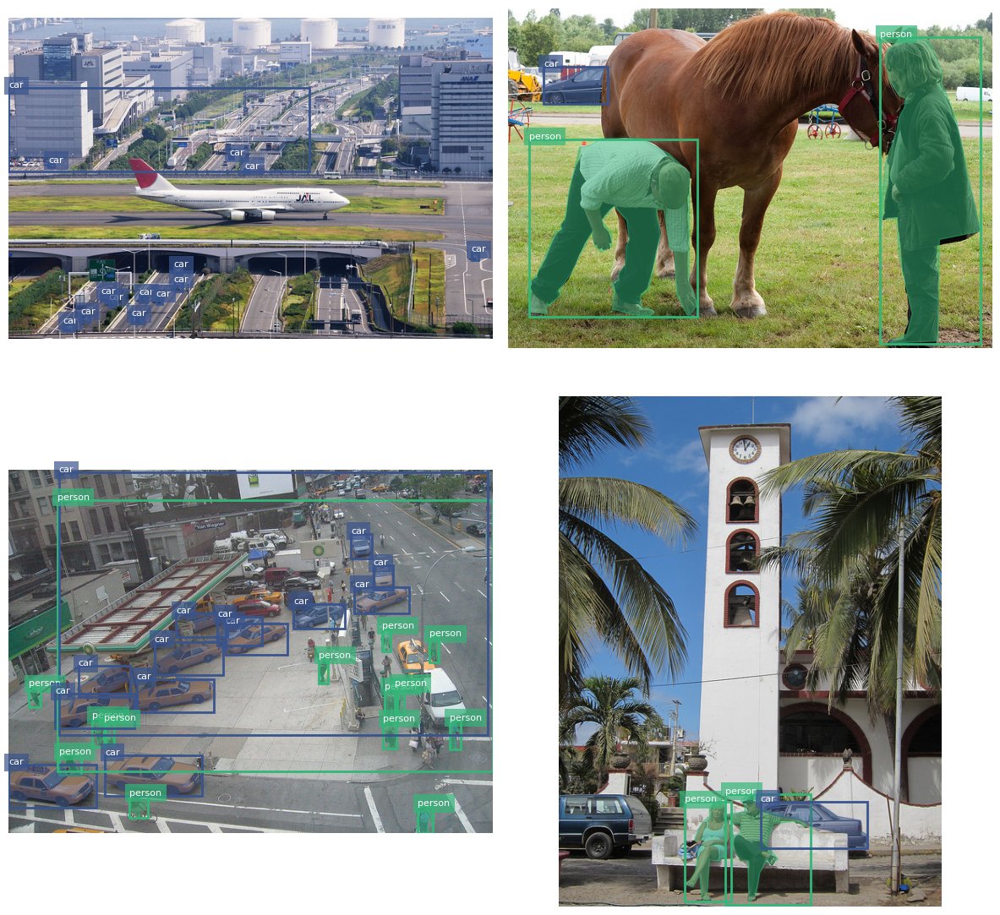

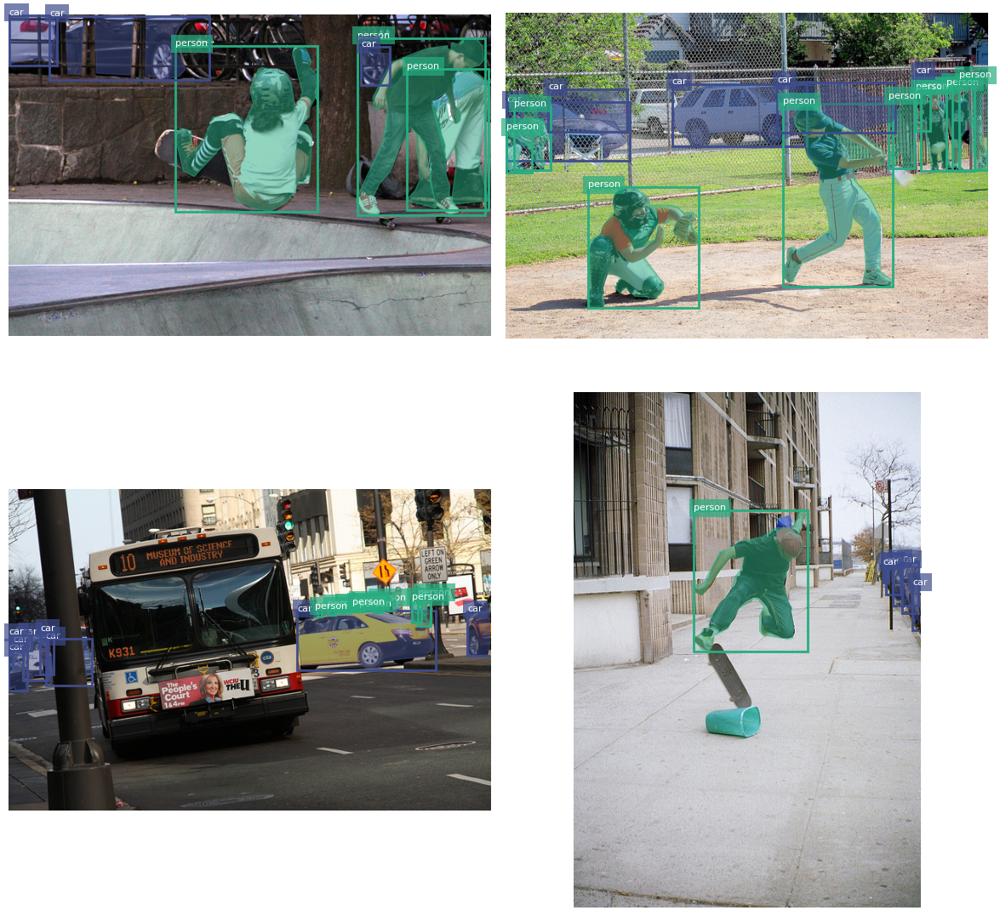

In [5]:
#To display the training and validation dataset images

#Function to display dataset images along with their annotations.
def display_dataset_images(image_folder_path, annotations_path, categories_to_display):
  # Open and load the COCO annotations file.
  with open(annotations_path, 'r') as file:
    coco_data = json.load(file)

    colors = plt.cm.viridis(np.linspace(0, 1, len(coco_data['categories'])))  #Generating color pallete

    category_id_to_name = {cat['id']: cat['name'] for cat in coco_data['categories'] if cat['name'] in categories_to_display}  #Creating a mapping from category IDs to their names

    annotations = [ann for ann in coco_data['annotations'] if category_id_to_name.get(ann['category_id'])]  #Filtering annotations to include only those that belong to the selected categories

    image_files = [os.path.join(image_folder_path, image_info['file_name']) for image_info in coco_data['images']]  #Compile a list of image file paths from the dataset
    selected_images = random.sample(image_files, 4)

    figure, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))  #Setting up the plot with 4 subplots in a 2x2 grid
    axes = axes.flatten()

    #Looping through each selected image file and its corresponding subplot axis
    for ax, image_file in zip(axes, selected_images):
        # Reading and converting the image from BGR to RGB color
        img = cv2.imread(image_file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_axis_off()

        #Extracting the filename and find the corresponding image information in the COCO data
        filename = os.path.basename(image_file)
        image_info = next((item for item in coco_data['images'] if item['file_name'] == filename), None)
        image_id = image_info['id']

        image_annotations = [ann for ann in annotations if ann['image_id'] == image_id]  #Filtering annotations for the current image

        #Looping through each annotation to display its bounding box and segmentation
        for annotation in image_annotations:
            category = annotation['category_id']
            color = colors[category % len(colors)]

            bbox = annotation['bbox']  #Drawing the bounding box
            rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)

            #Displaying the category name as a label
            label = category_id_to_name[category]
            ax.text(bbox[0], bbox[1], label, color='white', fontsize=8, bbox=dict(facecolor=color, edgecolor='none', alpha=0.7))

            if 'segmentation' in annotation:
              seg = annotation['segmentation']
              if isinstance(seg, list):
                for poly_coords in seg:
                  poly = np.array(poly_coords).reshape((len(poly_coords)//2, 2))
                  polygon = patches.Polygon(poly, linewidth=1, edgecolor=color, facecolor=color, alpha=0.5)
                  ax.add_patch(polygon)
    #Adjusting the  layout and display the figure
    plt.tight_layout()
    plt.show()

#Function to display images from the training dataset
def display_training_images(categories_to_display):
  #Specifying the paths to the training data and annotations
  train_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/data"
  train_annotations_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/labels.json"
  display_dataset_images(train_folder_path, train_annotations_path, categories_to_display)

#Function to display images from the validation dataset
def display_validation_images(categories_to_display):
  #Specifying the paths to the validation data and annotations
  val_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/data"
  val_annotations_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/labels.json"
  display_dataset_images(val_folder_path, val_annotations_path, categories_to_display)

categories_to_display = ['person', 'car', 'dog', 'cake']  #Specifying categories to display

#To display images for training and validation datasets
display_training_images(categories_to_display)
display_validation_images(categories_to_display)

EDA for Training Dataset:


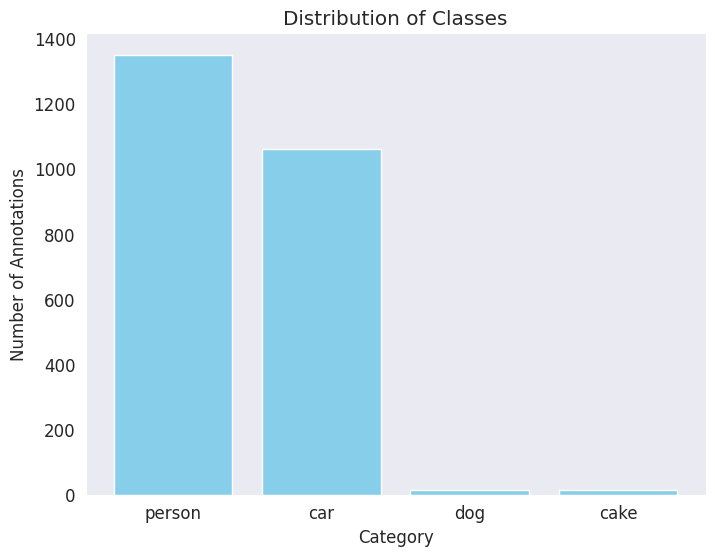

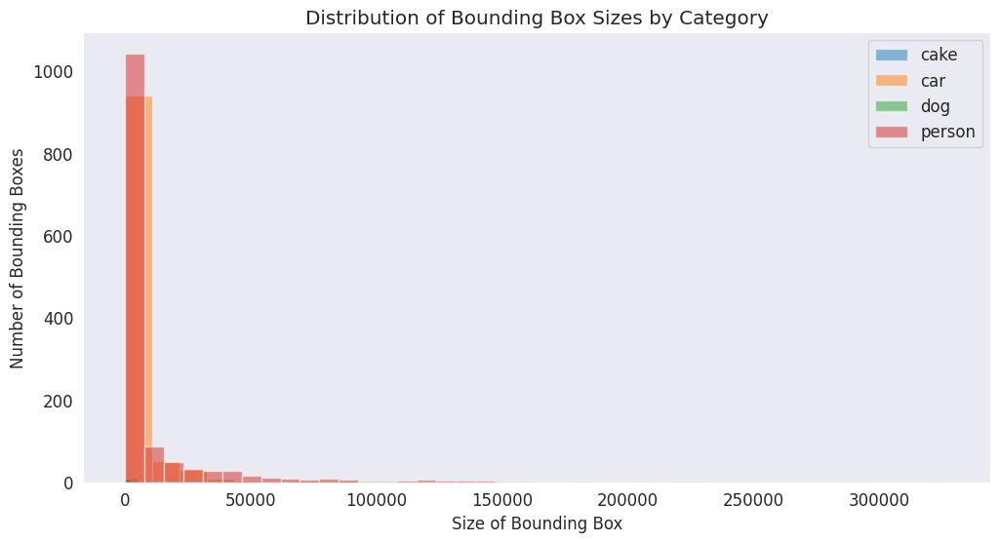

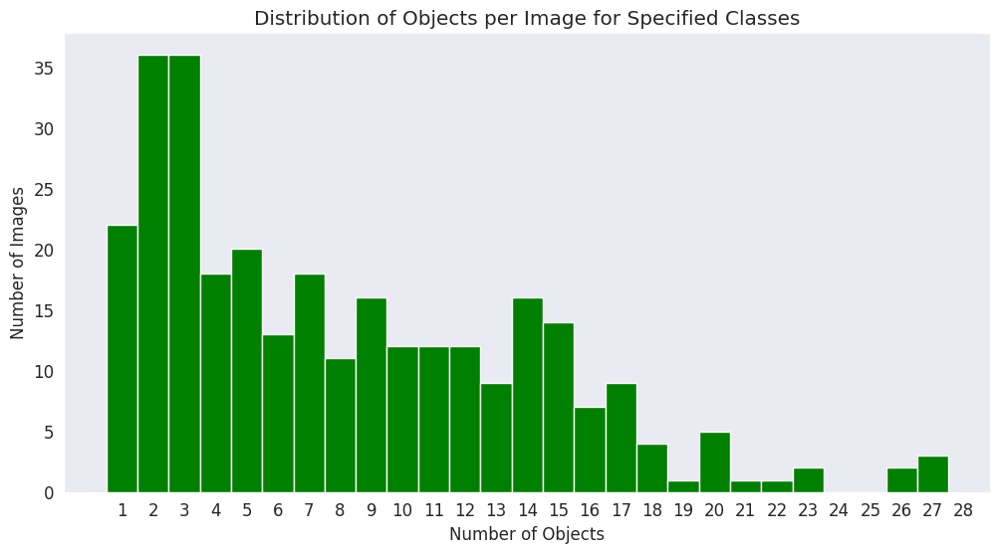

EDA for Validation Dataset:


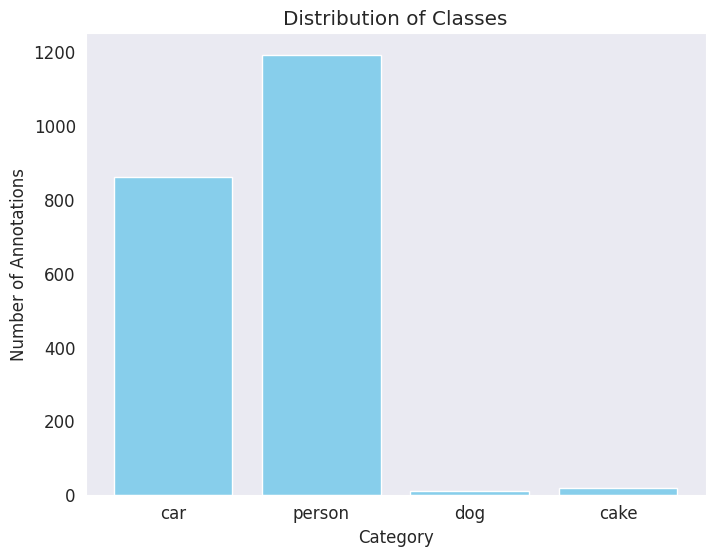

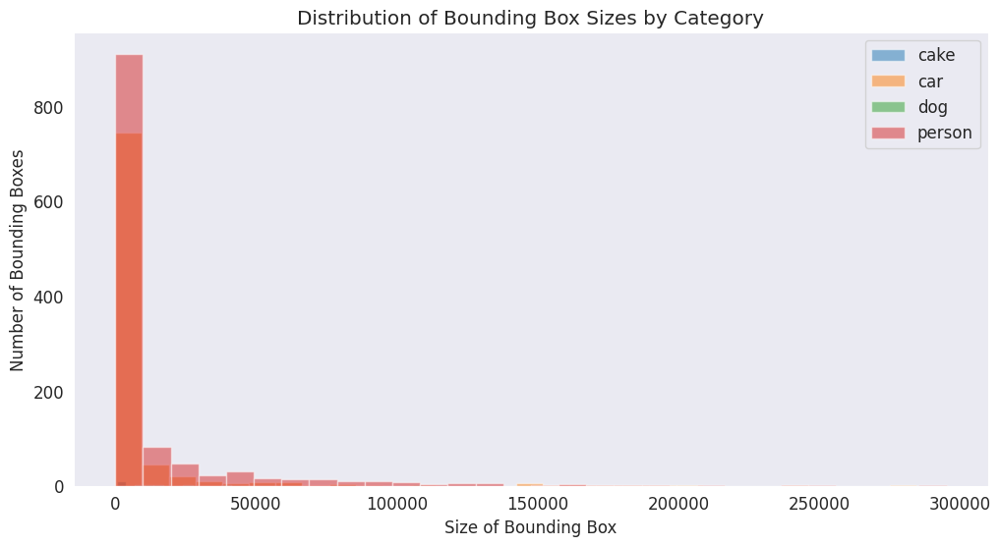

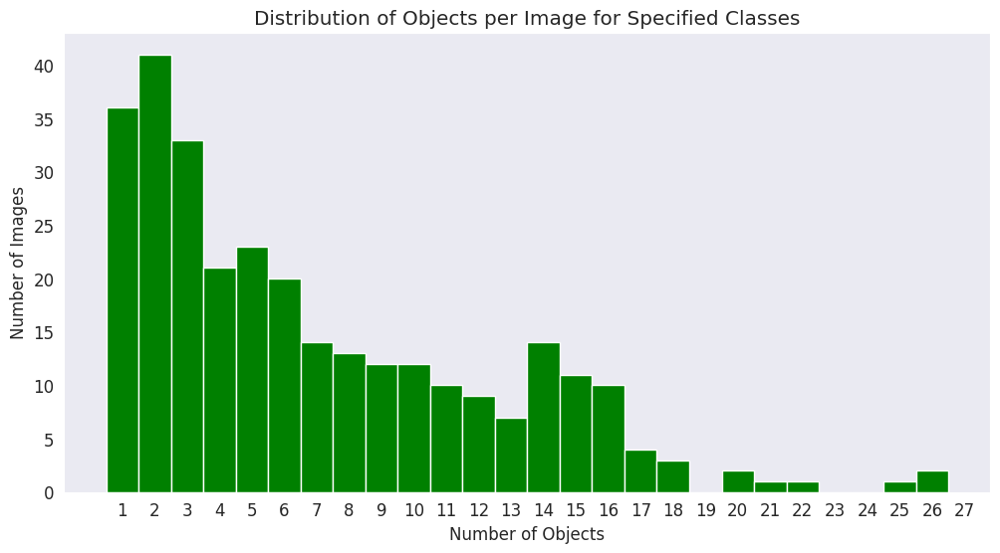

In [6]:
#To perform EDA on both training and validation datasets

#Performing EDA on annotations to understand dataset distribution
def perform_eda(annotations_path, categories_of_interest):
  with open(annotations_path, 'r') as file:
    coco_data = json.load(file)

    categories = {category['id']: category['name'] for category in coco_data['categories']}
    annotations = coco_data['annotations']

    filtered_annotations = [ann for ann in annotations if categories[ann['category_id']] in ['person', 'car', 'dog', 'cake']]

    category_counts = Counter(ann['category_id'] for ann in filtered_annotations)

    plt.figure(figsize=(8, 6))
    plt.bar([categories[i] for i in category_counts.keys()], category_counts.values(), color='skyblue')
    plt.title('Distribution of Classes')
    plt.xlabel('Category')
    plt.ylabel('Number of Annotations')
    plt.show()

    plt.figure(figsize=(12, 6))
    for category_id, name in categories.items():
      if name in ['person', 'car', 'dog', 'cake']:
        bbox_sizes = [ann['bbox'][2] * ann['bbox'][3] for ann in filtered_annotations if ann['category_id'] == category_id]
        plt.hist(bbox_sizes, bins=30, alpha=0.5, label=name)
    plt.title('Distribution of Bounding Box Sizes by Category')
    plt.xlabel('Size of Bounding Box')
    plt.ylabel('Number of Bounding Boxes')
    plt.legend()
    plt.show()

    objects_per_image = Counter(ann['image_id'] for ann in filtered_annotations)

    plt.figure(figsize=(12, 6))
    plt.hist(objects_per_image.values(), bins=range(1, max(objects_per_image.values()) + 1), align='left', color='green')
    plt.title('Distribution of Objects per Image for Specified Classes')
    plt.xlabel('Number of Objects')
    plt.ylabel('Number of Images')
    plt.xticks(range(1, max(objects_per_image.values()) + 1))
    plt.show()

categories_to_analyze = ['person', 'car', 'dog', 'cake']

train_annotations_path = '/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/labels.json'
val_annotations_path = '/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/labels.json'

#Performing EDA for both training and validation datasets
print("EDA for Training Dataset:")
perform_eda(train_annotations_path, categories_to_analyze)

print("EDA for Validation Dataset:")
perform_eda(val_annotations_path, categories_to_analyze)

In [7]:
#Function to check the count of the categories from the annotations file
def get_category_counts(annotations_path, categories):
    with open(annotations_path) as file:
        data = json.load(file)

    category_id_to_name = {category['id']: category['name'] for category in data['categories']}

    category_counts = {category: 0 for category in categories}

    for annotation in data['annotations']:
      category_name = category_id_to_name.get(annotation['category_id'])
      if category_name in categories:
        category_counts[category_name] += 1

    return category_counts

train_annotations_path = '/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/labels.json'
val_annotations_path = '/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/labels.json'

categories = ['person', 'car', 'dog', 'cake']

train_counts = get_category_counts(train_annotations_path, categories)
print("Training dataset category counts:", train_counts)

val_counts = get_category_counts(val_annotations_path, categories)
print("Validation dataset category counts:", val_counts)

Training dataset category counts: {'person': 1350, 'car': 1061, 'dog': 14, 'cake': 13}
Validation dataset category counts: {'person': 1191, 'car': 861, 'dog': 9, 'cake': 18}


Processing training dataset:


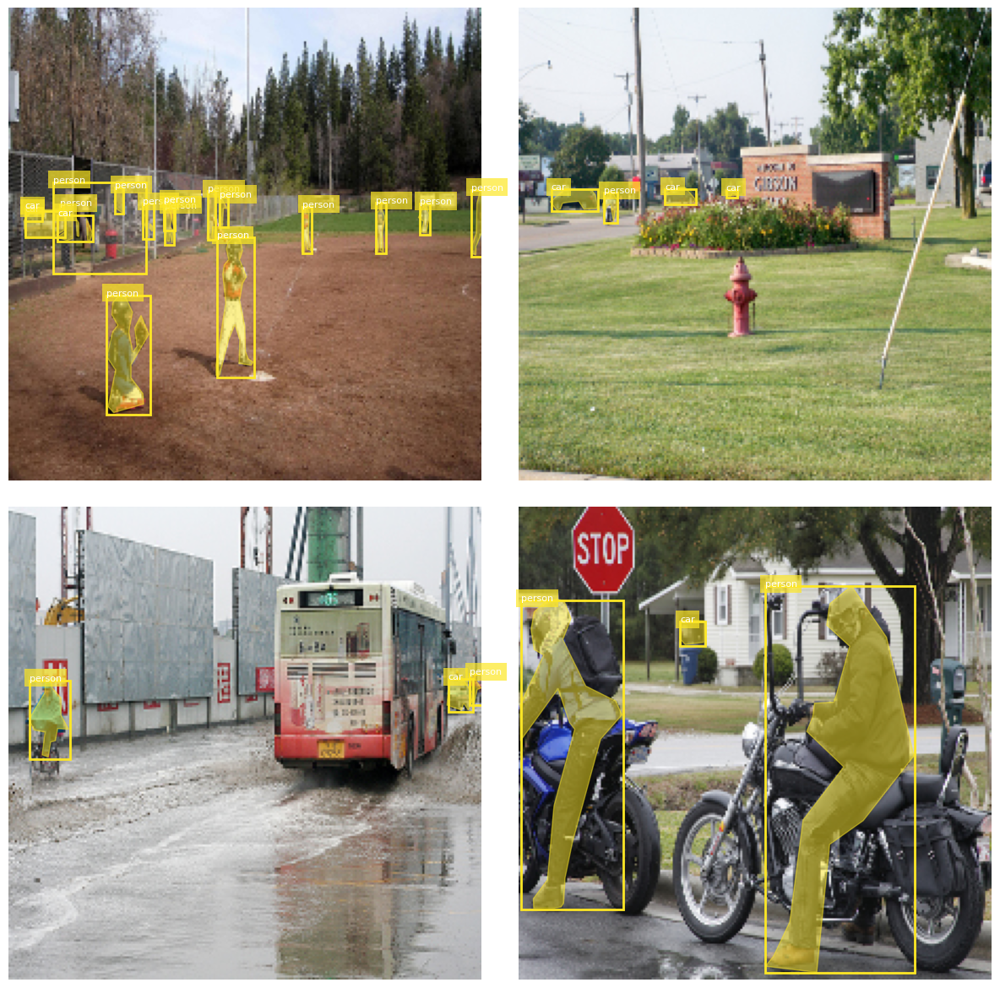

Processing validation dataset:


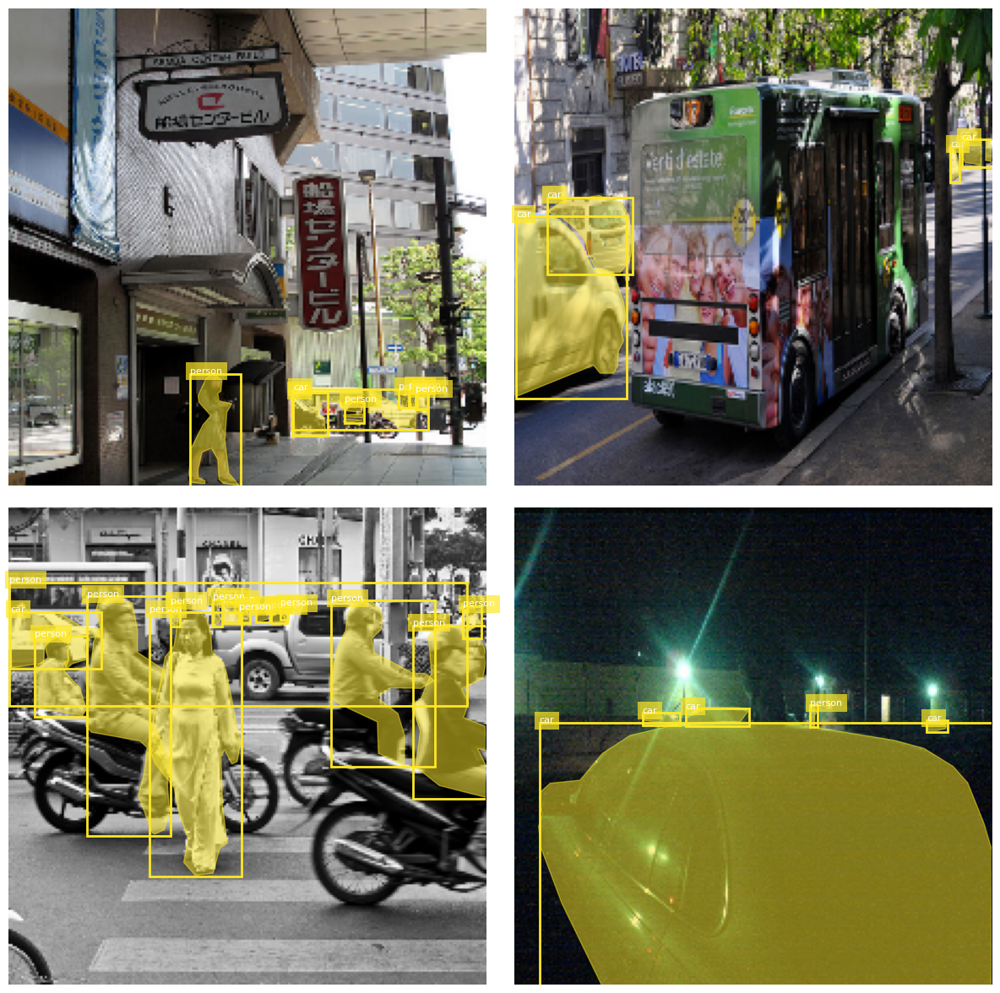

In [8]:
#Applying preprocessing technique to the training and validation datasets

#Function to preprocess the image
def preprocess_image(image_path, target_size):
  img = cv2.imread(image_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = img / 255.0
  img = cv2.resize(img, target_size)
  return img

#Function to adjust the annotations
def adjust_annotation(annotation, original_size, target_size):
  scale_x = target_size[0] / original_size[1]
  scale_y = target_size[1] / original_size[0]

  annotation['bbox'] = [
        annotation['bbox'][0] * scale_x,
        annotation['bbox'][1] * scale_y,
        annotation['bbox'][2] * scale_x,
        annotation['bbox'][3] * scale_y,
    ]

  if 'segmentation' in annotation and isinstance(annotation['segmentation'], list):
    new_segmentation = []
    for seg in annotation['segmentation']:
      if isinstance(seg, list):
        if all(isinstance(coord, (list, tuple)) for coord in seg):
          for polygon in seg:
            scaled_polygon = [coord * scale_x if i % 2 == 0 else coord * scale_y for i, coord in enumerate(polygon)]
            new_segmentation.append(scaled_polygon)
        else:
          scaled_seg = [seg[i] * scale_x if i % 2 == 0 else seg[i] * scale_y for i in range(len(seg))]
          new_segmentation.append(scaled_seg)

    annotation['segmentation'] = new_segmentation

  return annotation

def process_dataset(image_folder_path, annotations_path, categories_to_display, target_size=(224, 224)):
  with open(annotations_path, 'r') as file:
    coco_data = json.load(file)

  category_id_to_name = {cat['id']: cat['name'] for cat in coco_data['categories'] if cat['name'] in categories_to_display}
  annotations = [ann for ann in coco_data['annotations'] if category_id_to_name.get(ann['category_id'])]

  image_files = [os.path.join(image_folder_path, image_info['file_name']) for image_info in coco_data['images']]
  selected_images = random.sample(image_files, min(4, len(image_files)))

  figure, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
  axes = axes.flatten()

  for ax, image_file in zip(axes, selected_images):
    img = preprocess_image(image_file, target_size)
    ax.imshow(img)
    ax.set_axis_off()

    filename = os.path.basename(image_file)
    original_size = cv2.imread(image_file).shape
    image_info = next((item for item in coco_data['images'] if item['file_name'] == filename), None)
    image_id = image_info['id']

    image_annotations = [ann for ann in annotations if ann['image_id'] == image_id]

    for annotation in image_annotations:
      adjusted_annotation = adjust_annotation(annotation, original_size, target_size)
      category = adjusted_annotation['category_id']
      color = plt.cm.viridis(category / len(category_id_to_name))

      bbox = adjusted_annotation['bbox']
      rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor=color, facecolor='none')
      ax.add_patch(rect)

      label = category_id_to_name[category]
      ax.text(bbox[0], bbox[1], label, color='white', fontsize=8, bbox=dict(facecolor=color, edgecolor='none', alpha=0.7))

      if 'segmentation' in adjusted_annotation:
        seg = adjusted_annotation['segmentation']
        if isinstance(seg, list):
          for poly_coords in seg:
            poly = np.array(poly_coords).reshape((len(poly_coords)//2, 2))
            polygon = patches.Polygon(poly, linewidth=1, edgecolor=color, facecolor=color, alpha=0.5)
            ax.add_patch(polygon)
  plt.tight_layout()
  plt.show()

train_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/data"
train_annotations_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/labels.json"
val_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/data"
val_annotations_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/labels.json"

categories_to_display = ['person', 'car', 'dog', 'cake']

#Preprocessing the training and validation datasets
print("Processing training dataset:")
process_dataset(train_folder_path, train_annotations_path, categories_to_display, target_size=(224, 224))

print("Processing validation dataset:")
process_dataset(val_folder_path, val_annotations_path, categories_to_display, target_size=(224, 224))


In [13]:
#Applying data augmentation technique to the training and validation datasets

#Defining the augmentation sequence
seq = iaa.Sequential([
    iaa.Fliplr(0.5),  #Horizontal flips
    iaa.Crop(percent=(0, 0.1)),  #Random crops
    iaa.Sometimes(0.5, iaa.GaussianBlur(sigma=(0, 0.5))),  #Small gaussian blur with random sigma between 0 and 0.5
    iaa.LinearContrast((0.75, 1.5)),  #Strengthening or weakening the contrast in each image
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),   #Adding gaussian noise
    iaa.Multiply((0.8, 1.2)),  #Making some images brighter and some darker
    #Applying affine transformations to each image
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True)

def augment_image(image, n_augmentations=50):
    images_aug = [seq.augment_image(image) for _ in range(n_augmentations)]
    return images_aug

#Function to augment images in the dataset and update annotations accordingly
def augment_dataset_with_annotations(image_folder_path, annotations_path, target_size=(224, 224), categories_of_interest=['dog', 'cake'], n_augmentations=50):
    with open(annotations_path, 'r') as file:
        coco_data = json.load(file)

    new_annotations = []

    for ann in coco_data['annotations']:
        category_id = ann['category_id']

        category_name = next((cat['name'] for cat in coco_data['categories'] if cat['id'] == category_id), None)
        if category_name in categories_of_interest:
            image_info = next((img for img in coco_data['images'] if img['id'] == ann['image_id']), None)
            if image_info:
                image_path = os.path.join(image_folder_path, image_info['file_name'])
                if os.path.exists(image_path):
                    image = cv2.imread(image_path)
                    images_aug = augment_image(image, n_augmentations=n_augmentations)
                    for i, image_aug in enumerate(images_aug, start=1):

                        aug_image_filename = f"aug_{category_name}_{i}_{image_info['file_name']}"
                        aug_image_path = os.path.join(image_folder_path, aug_image_filename)
                        image_resized = cv2.resize(image_aug, target_size)
                        cv2.imwrite(aug_image_path, image_resized * 255)


                        new_ann = ann.copy()
                        new_ann['image_id'] = aug_image_filename
                        new_annotations.append(new_ann)
                else:
                    print(f"Image file does not exist: {image_path}")


    coco_data['annotations'].extend(new_annotations)


    updated_annotations_path = os.path.join(image_folder_path, "updated_annotations.json")
    with open(updated_annotations_path, 'w') as f:
        json.dump(coco_data, f)

train_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/data"
train_annotations_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/train-300/labels.json"
val_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/data"
val_annotations_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/validation-300/labels.json"

#Augmenting both traning and validation datasets
augment_dataset_with_annotations(train_folder_path, train_annotations_path, target_size=(224, 224), categories_of_interest=['dog', 'cake'], n_augmentations=50)
augment_dataset_with_annotations(val_folder_path, val_annotations_path, target_size=(224, 224), categories_of_interest=['dog', 'cake'], n_augmentations=50)

In [14]:
#Checking if all the augmented images have corresponding annotations

annotations_path = "/content/drive/MyDrive/RM_Segmentation_Assignment_dataset/train-300/data/updated_annotations.json"
with open(annotations_path, 'r') as f:
  data = json.load(f)

augmented_images = [image for image in data['images'] if image['file_name'].startswith("aug_")]

augmented_image_ids = {image['id'] for image in augmented_images}

annotated_image_ids = {ann['image_id'] for ann in data['annotations']}

missing_annotations = augmented_image_ids - annotated_image_ids
if missing_annotations:
  print(f"Missing annotations for the following augmented image IDs: {missing_annotations}")
else:
  print("All augmented images have corresponding annotations.")

All augmented images have corresponding annotations.


In [39]:
#Function to load images and corresponding masks based on annotations
def load_data(image_folder_path, annotations_path, categories_to_display, target_size=(224, 224)):
  with open(annotations_path, 'r') as file:
    coco_data = json.load(file)

  category_id_to_name = {cat['id']: cat['name'] for cat in coco_data['categories'] if cat['name'] in categories_to_display}

  images = []
  masks = []

  for image_info in coco_data['images']:
    #Checking if the image belongs to the categories to display
    image_annotations = [ann for ann in coco_data['annotations'] if ann['image_id'] == image_info['id'] and category_id_to_name.get(ann['category_id']) in categories_to_display]

    if not image_annotations:
      continue

    image_path = os.path.join(image_folder_path, image_info['file_name'])
    if not os.path.exists(image_path):
      print(f"Image file does not exist: {image_path}")
      continue

    img = preprocess_image(image_path, target_size)

    mask = np.zeros(target_size + (1,), dtype=np.uint8)

    for annotation in image_annotations:
      category_id = annotation['category_id']
      category_name = category_id_to_name[category_id]

      if 'segmentation' in annotation:
        for seg in annotation['segmentation']:
          if isinstance(seg, list):  #Assuming polygon segmentation
            poly = np.array(seg).reshape((-1, 2))
            cv2.fillPoly(mask, [np.int32(poly)], 1)

    images.append(img)
    masks.append(mask)
  return np.array(images), np.array(masks)

In [40]:
#Defining a U-Net model for image segmentation
def create_unet(input_shape):
  inputs = Input(shape=input_shape)

  conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
  pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

  conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
  pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

  up3 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv2)
  merge3 = concatenate([conv1, up3], axis=3)
  conv3 = Conv2D(32, (3, 3), activation='relu', padding='same')(merge3)

  conv4 = Conv2D(1, (1, 1), activation='sigmoid')(conv3)

  model = Model(inputs=[inputs], outputs=[conv4])
  return model

In [42]:
train_folder_path = "/content/drive/MyDrive/RM_Segmentation_Assignment_dataset/train-300/data"
train_annotations_path = "/content/drive/MyDrive/RM_Segmentation_Assignment_dataset/train-300/data/updated_annotations.json"

val_folder_path = "/content/drive/MyDrive/RM_Segmentation_Assignment_dataset/validation-300/data"
val_annotations_path = "/content/drive/MyDrive/RM_Segmentation_Assignment_dataset/validation-300/data/updated_annotations.json"

categories_to_display = ['person', 'car', 'dog', 'cake']
input_shape = (224, 224, 3)

train_images, train_masks = load_data(train_folder_path, train_annotations_path, categories_to_display, target_size=input_shape[:2])
val_images, val_masks = load_data(val_folder_path, val_annotations_path, categories_to_display, target_size=input_shape[:2])

In [43]:
#Instantiating and compiling the U-Net model
model = create_unet(input_shape)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [44]:
#Training the model on preprocessed datasets
history = model.fit(train_images, train_masks, validation_data=(val_images, val_masks), epochs=10, batch_size=32)

Epoch 1/10
10/10 [==============================] - 139s 14s/step - loss: 0.5353 - accuracy: 0.8043 - val_loss: 0.4064 - val_accuracy: 0.8768
Epoch 2/10
10/10 [==============================] - 111s 11s/step - loss: 0.3931 - accuracy: 0.8978 - val_loss: 0.3986 - val_accuracy: 0.8768
Epoch 3/10
10/10 [==============================] - 126s 13s/step - loss: 0.3665 - accuracy: 0.8978 - val_loss: 0.3849 - val_accuracy: 0.8768
Epoch 4/10
10/10 [==============================] - 111s 11s/step - loss: 0.3457 - accuracy: 0.8978 - val_loss: 0.3824 - val_accuracy: 0.8768
Epoch 5/10
10/10 [==============================] - 127s 13s/step - loss: 0.3348 - accuracy: 0.8978 - val_loss: 0.3815 - val_accuracy: 0.8768
Epoch 6/10
10/10 [==============================] - 127s 13s/step - loss: 0.3297 - accuracy: 0.8978 - val_loss: 0.3750 - val_accuracy: 0.8768
Epoch 7/10
10/10 [==============================] - 113s 12s/step - loss: 0.3283 - accuracy: 0.8978 - val_loss: 0.3724 - val_accuracy: 0.8768
Epoch 

In [45]:
# Saving the trained model
model.save("segmentation_model.h5")

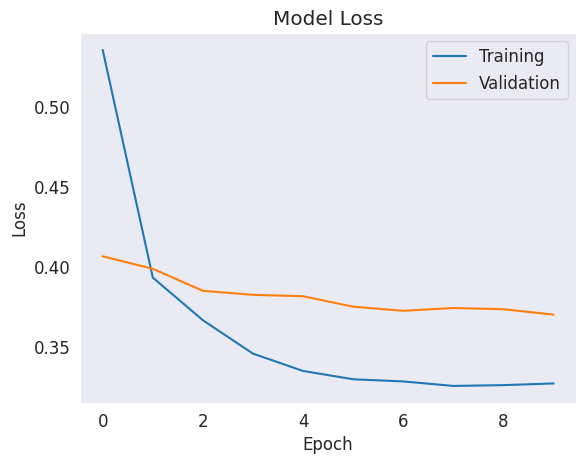

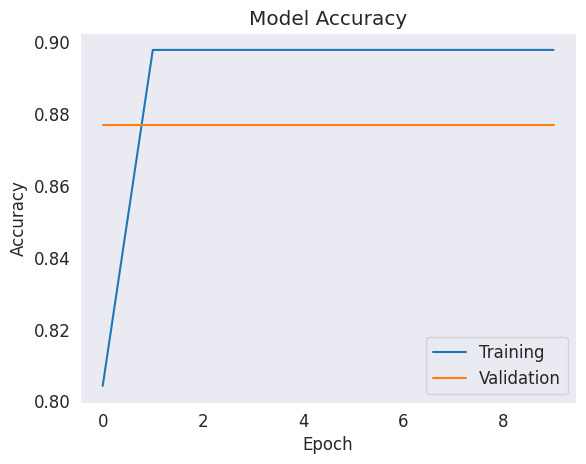

In [52]:
# Plot training and validation loss and accuracy
plt.plot(history.history['loss'], label='Training')
plt.plot(history.history['val_loss'], label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc=0)
plt.title('Model Loss')
plt.savefig('Loss')
plt.show()

plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc=0)
plt.title('Model Accuracy')
plt.savefig('Accuracy')

plt.show()

1/1 [==============================] - 0s 254ms/step


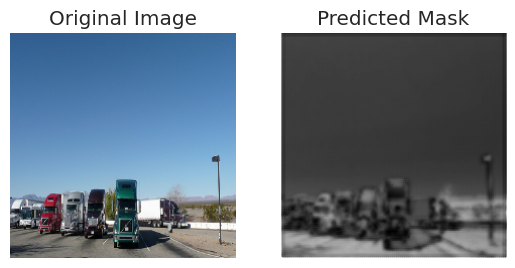

1/1 [==============================] - 0s 129ms/step


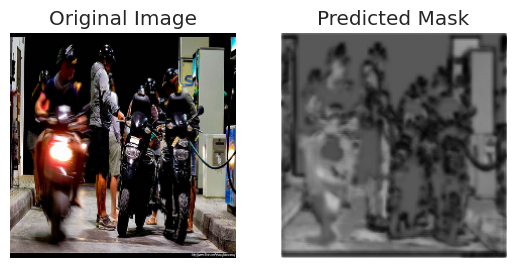

1/1 [==============================] - 0s 148ms/step


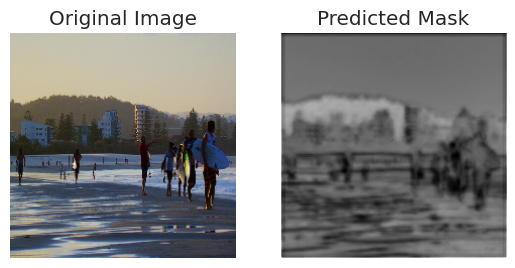

1/1 [==============================] - 0s 140ms/step


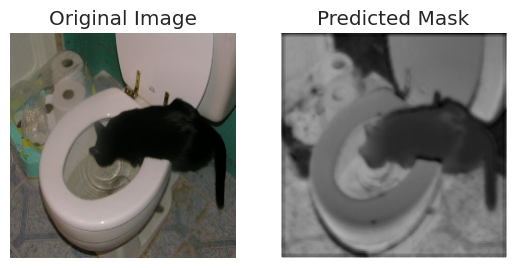

1/1 [==============================] - 0s 79ms/step


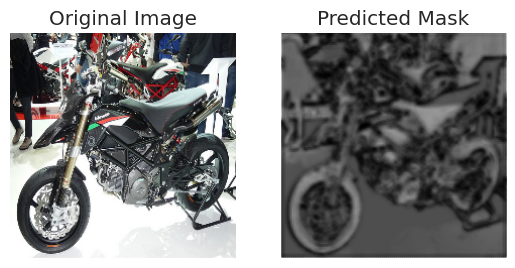

1/1 [==============================] - 0s 98ms/step


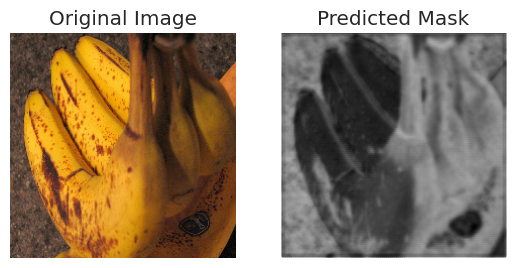

1/1 [==============================] - 0s 83ms/step


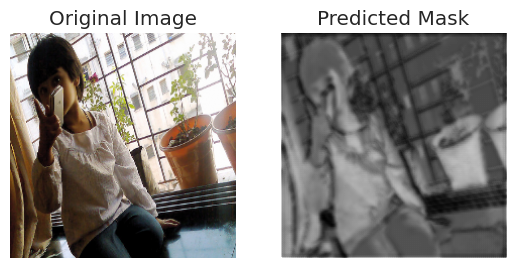

1/1 [==============================] - 0s 75ms/step


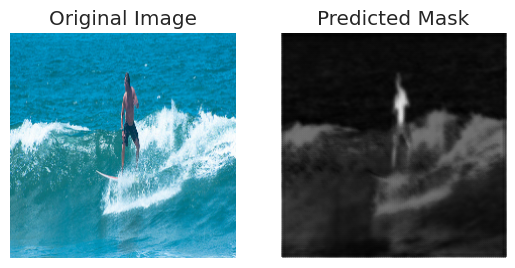

1/1 [==============================] - 0s 75ms/step


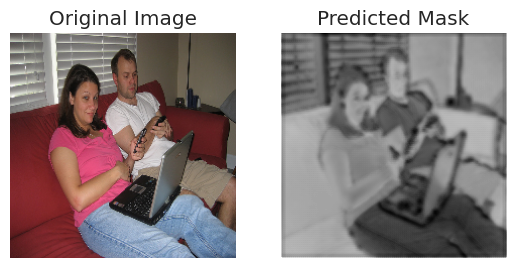

1/1 [==============================] - 0s 73ms/step


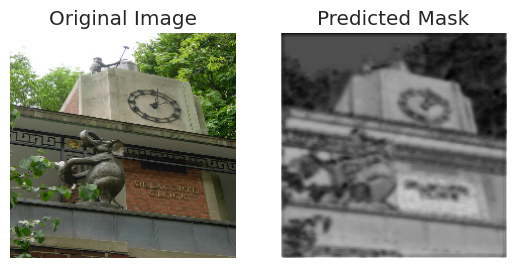

1/1 [==============================] - 0s 81ms/step


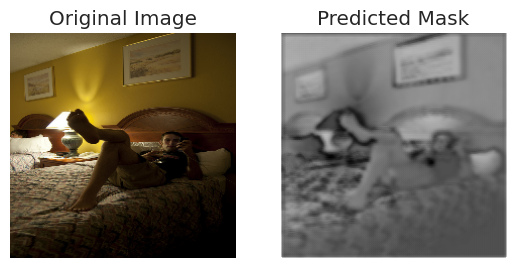

1/1 [==============================] - 0s 76ms/step


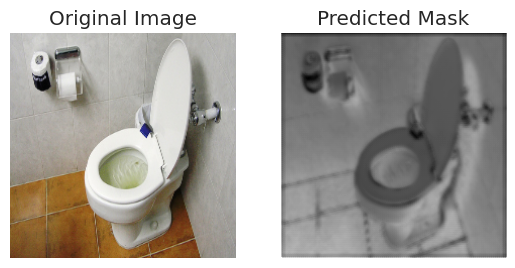

1/1 [==============================] - 0s 76ms/step


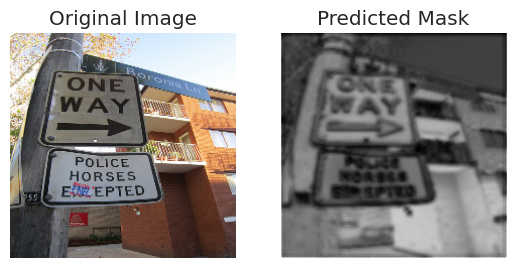

1/1 [==============================] - 0s 89ms/step


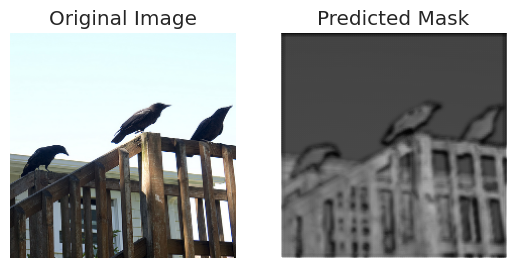

1/1 [==============================] - 0s 74ms/step


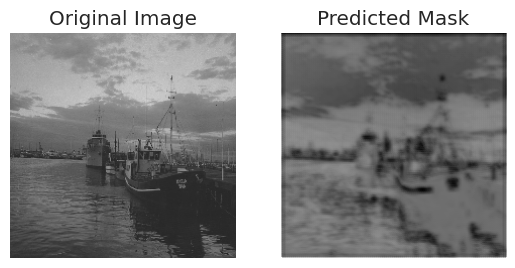

1/1 [==============================] - 0s 74ms/step


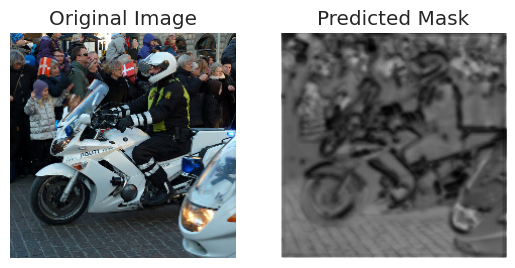

1/1 [==============================] - 0s 84ms/step


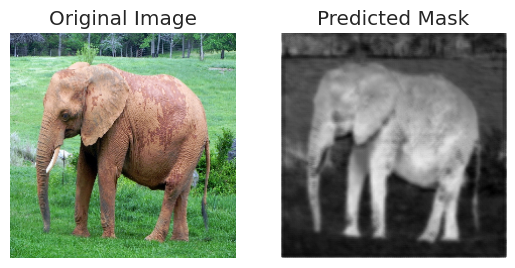

1/1 [==============================] - 0s 80ms/step


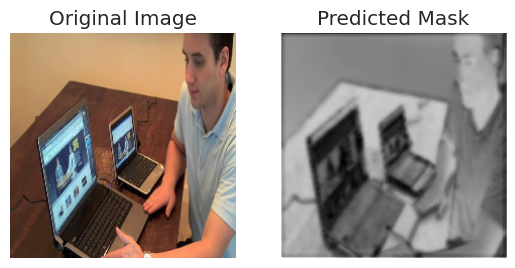

1/1 [==============================] - 0s 83ms/step


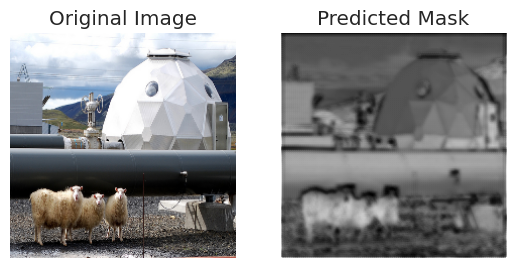

1/1 [==============================] - 0s 79ms/step


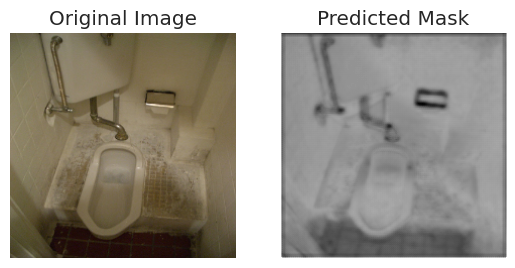

1/1 [==============================] - 0s 95ms/step


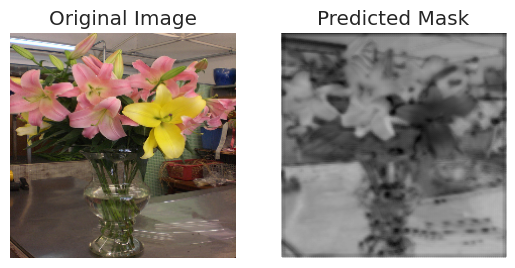

1/1 [==============================] - 0s 87ms/step


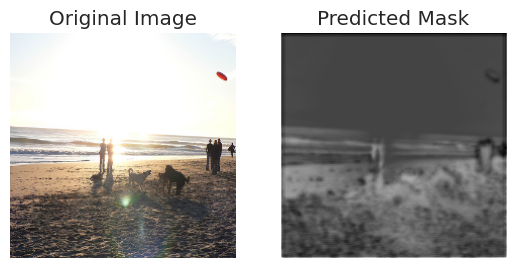

1/1 [==============================] - 0s 126ms/step


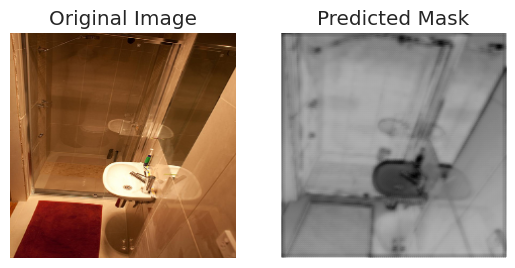

1/1 [==============================] - 0s 164ms/step


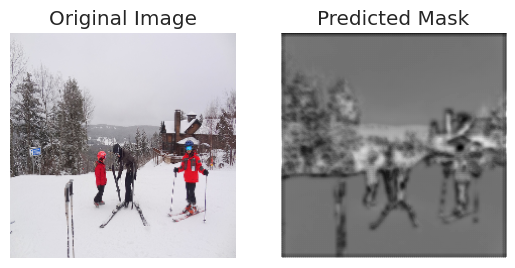

1/1 [==============================] - 0s 129ms/step


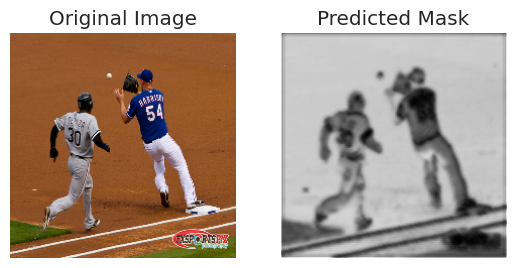

1/1 [==============================] - 0s 130ms/step


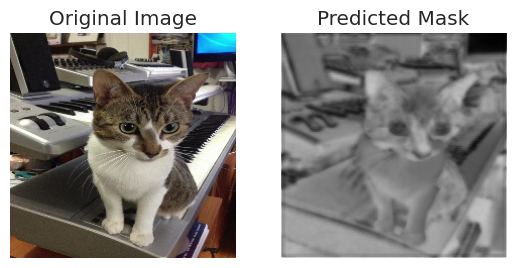

1/1 [==============================] - 0s 168ms/step


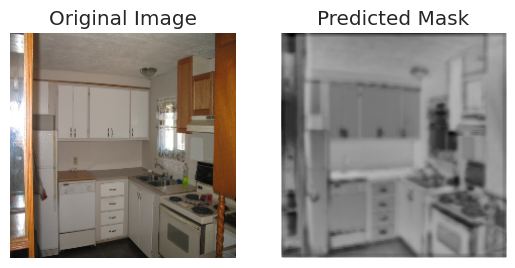

1/1 [==============================] - 0s 150ms/step


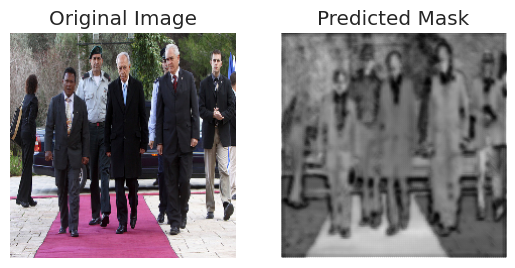

1/1 [==============================] - 0s 94ms/step


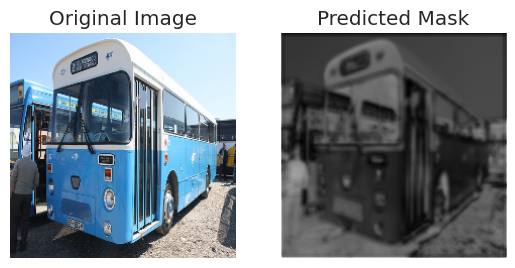

1/1 [==============================] - 0s 100ms/step


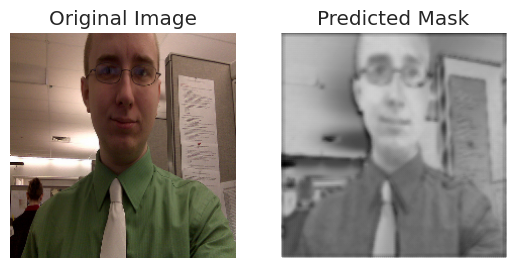

In [47]:
#Function to Load test images and visualize segmentation predictions
def preprocess_image(image_path, target_size):
  img = cv2.imread(image_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = img / 255.0
  img = cv2.resize(img, target_size)
  return img

def load_test_images(image_folder_path, target_size=(224, 224)):
  image_files = [os.path.join(image_folder_path, file) for file in os.listdir(image_folder_path) if file.endswith('.jpg') or file.endswith('.png')]
  images = []

  for image_file in image_files:
    img = preprocess_image(image_file, target_size)
    images.append(img)

  return np.array(images)

def visualize_segmentation(images, model):
  for i, image in enumerate(images):
    pred_mask = model.predict(image[np.newaxis, ...])[0]
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(pred_mask.squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.show()

test_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/test-30"

#Loading the trained images
test_images = load_test_images(test_folder_path, target_size=(224, 224))

model = load_model("segmentation_model.h5")

#Visualizing segmentation results
visualize_segmentation(test_images, model)

Predicted caption based test dataset:
1/1 [==============================] - 0s 81ms/step


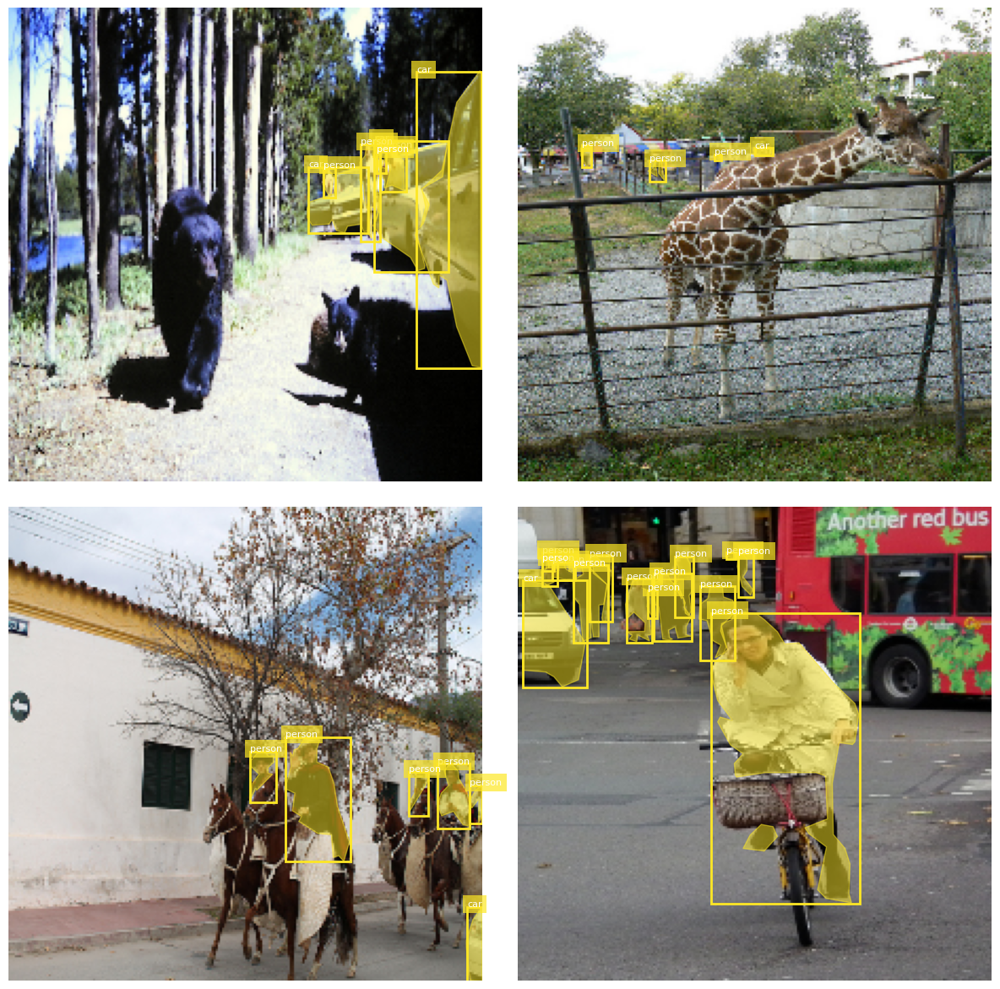

In [48]:
#Predicting the captions for the model
caption_model = load_model("/content/segmentation_model.h5")  #Caption model

def preprocess_image(image_path, target_size):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255.0
    img = cv2.resize(img, target_size)
    return img

def predict_caption(img_array):
  captions = caption_model.predict(img_array)
  return captions[0]


def adjust_annotation(annotation, original_size, target_size):
    scale_x = target_size[0] / original_size[1]
    scale_y = target_size[1] / original_size[0]

    annotation['bbox'] = [
        annotation['bbox'][0] * scale_x,
        annotation['bbox'][1] * scale_y,
        annotation['bbox'][2] * scale_x,
        annotation['bbox'][3] * scale_y,
    ]

    if 'segmentation' in annotation and isinstance(annotation['segmentation'], list):
        new_segmentation = []
        for seg in annotation['segmentation']:
            if isinstance(seg, list):
                if all(isinstance(coord, (list, tuple)) for coord in seg):
                    for polygon in seg:
                        scaled_polygon = [coord * scale_x if i % 2 == 0 else coord * scale_y for i, coord in enumerate(polygon)]
                        new_segmentation.append(scaled_polygon)
                else:
                    scaled_seg = [seg[i] * scale_x if i % 2 == 0 else seg[i] * scale_y for i in range(len(seg))]
                    new_segmentation.append(scaled_seg)

        annotation['segmentation'] = new_segmentation

    return annotation

def process_dataset(image_folder_path, annotations_path, categories_to_display, target_size=(224, 224)):
    with open(annotations_path, 'r') as file:
        coco_data = json.load(file)

    category_id_to_name = {cat['id']: cat['name'] for cat in coco_data['categories'] if cat['name'] in categories_to_display}
    annotations = [ann for ann in coco_data['annotations'] if category_id_to_name.get(ann['category_id'])]

    image_files = [os.path.join(image_folder_path, image_info['file_name']) for image_info in coco_data['images']]
    selected_images = random.sample(image_files, min(4, len(image_files)))

    figure, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
    axes = axes.flatten()

    for ax, image_file in zip(axes, selected_images):
        img = preprocess_image(image_file, target_size)
        ax.imshow(img)
        ax.set_axis_off()

        filename = os.path.basename(image_file)
        original_size = cv2.imread(image_file).shape
        image_info = next((item for item in coco_data['images'] if item['file_name'] == filename), None)
        image_id = image_info['id']

        image_annotations = [ann for ann in annotations if ann['image_id'] == image_id]

        for annotation in image_annotations:
            adjust_annotation(annotation, original_size, target_size)  # Call adjust_annotation function here

            category = annotation['category_id']
            color = plt.cm.viridis(category / len(category_id_to_name))

            bbox = annotation['bbox']
            rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)

            label = category_id_to_name[category]
            ax.text(bbox[0], bbox[1], label, color='white', fontsize=8, bbox=dict(facecolor=color, edgecolor='none', alpha=0.7))

            if 'segmentation' in annotation:
                seg = annotation['segmentation']
                if isinstance(seg, list):
                    for poly_coords in seg:
                        poly = np.array(poly_coords).reshape((len(poly_coords)//2, 2))
                        polygon = patches.Polygon(poly, linewidth=1, edgecolor=color, facecolor=color, alpha=0.5)
                        ax.add_patch(polygon)
        #Predicting caption for the image
        img_array = np.expand_dims(img, axis=0)
        caption = predict_caption(img_array)

    plt.tight_layout()
    plt.show()

test_folder_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/test-30"
test_annotations_path = "/content/drive/MyDrive/Colab Notebooks/RM_Segmentation_Assignment_dataset/test-30"

categories_to_display = ['person', 'car', 'dog', 'cake']

print("Predicted caption based test dataset:")
process_dataset(train_folder_path, train_annotations_path, categories_to_display)